<table>
    <tr>
        <td>
            <div align ="center">
                <font color="darkblue" size=8px>
                    <b> Deep Learning Project on <br> License plate detection of cars
                    </b>
                </font>
            </div>
        </td>
    <tr>
<table>

### <font color=darkblue>Team 9:Aamir Sharif, Bumika.N, Darshan.M, Hitesh Nayaka, Xitij Patel</font>

In [1]:
#importing required libraries
import tensorflow as tf
from tensorflow.keras.applications import MobileNet

import cv2
import numpy as np
%matplotlib inline

import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import cv2
import os
import glob
from warnings import filterwarnings
filterwarnings('ignore')

In [2]:
import os
for dirname, _, filenames in os.walk('C:\\Users\\admin\\Music\\M.Tech DSML\\SEMESTER 2\\Intro to Deep Learning and  application\\presentation\\dataset\\'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

C:\Users\admin\Music\M.Tech DSML\SEMESTER 2\Intro to Deep Learning and  application\presentation\dataset\annotations\Cars0.xml
C:\Users\admin\Music\M.Tech DSML\SEMESTER 2\Intro to Deep Learning and  application\presentation\dataset\annotations\Cars1.xml
C:\Users\admin\Music\M.Tech DSML\SEMESTER 2\Intro to Deep Learning and  application\presentation\dataset\annotations\Cars10.xml
C:\Users\admin\Music\M.Tech DSML\SEMESTER 2\Intro to Deep Learning and  application\presentation\dataset\annotations\Cars100.xml
C:\Users\admin\Music\M.Tech DSML\SEMESTER 2\Intro to Deep Learning and  application\presentation\dataset\annotations\Cars101.xml
C:\Users\admin\Music\M.Tech DSML\SEMESTER 2\Intro to Deep Learning and  application\presentation\dataset\annotations\Cars102.xml
C:\Users\admin\Music\M.Tech DSML\SEMESTER 2\Intro to Deep Learning and  application\presentation\dataset\annotations\Cars103.xml
C:\Users\admin\Music\M.Tech DSML\SEMESTER 2\Intro to Deep Learning and  application\presentation\datas

In [3]:
img_dir="C:\\Users\\admin\\Music\\M.Tech DSML\\SEMESTER 2\\Intro to Deep Learning and  application\\presentation\\dataset\\images\\"

IMAGE_SIZE=224

data_path = os.path.join(img_dir,'*g')
files = glob.glob(data_path)
files.sort() #We sort the images in alphabetical order to match them to the xml files containing the annotations of the bounding boxes
X=[]
for f1 in files:
    img = cv2.imread(f1)
    img = cv2.resize(img, (IMAGE_SIZE,IMAGE_SIZE))
    X.append(np.array(img))

In [4]:
from lxml import etree

def resizeannotation(f):
    tree = etree.parse(f)
    for dim in tree.xpath("size"):
        width = int(dim.xpath("width")[0].text)
        height = int(dim.xpath("height")[0].text)
    for dim in tree.xpath("object/bndbox"):
        xmin = int(dim.xpath("xmin")[0].text)/(width/IMAGE_SIZE)
        ymin = int(dim.xpath("ymin")[0].text)/(height/IMAGE_SIZE)
        xmax = int(dim.xpath("xmax")[0].text)/(width/IMAGE_SIZE)
        ymax = int(dim.xpath("ymax")[0].text)/(height/IMAGE_SIZE)
    return [int(xmax), int(ymax), int(xmin), int(ymin)]

In [5]:
path = 'C:\\Users\\admin\\Music\\M.Tech DSML\\SEMESTER 2\\Intro to Deep Learning and  application\\presentation\\dataset\\annotations\\'
text_files = ['C:\\Users\\admin\\Music\\M.Tech DSML\\SEMESTER 2\\Intro to Deep Learning and  application\\presentation\\dataset\\annotations\\'+f for f in sorted(os.listdir(path))]
y=[]
for i in text_files:
    y.append(resizeannotation(i))

In [6]:
resizeannotation("C:\\Users\\admin\\Music\\M.Tech DSML\\SEMESTER 2\\Intro to Deep Learning and  application\\presentation\\dataset\\annotations\\Cars199.xml")

[173, 133, 33, 74]

In [7]:
y[0]

[187, 144, 101, 104]

In [8]:
np.array(X).shape

(433, 224, 224, 3)

In [9]:
np.array(y).shape

(433, 4)

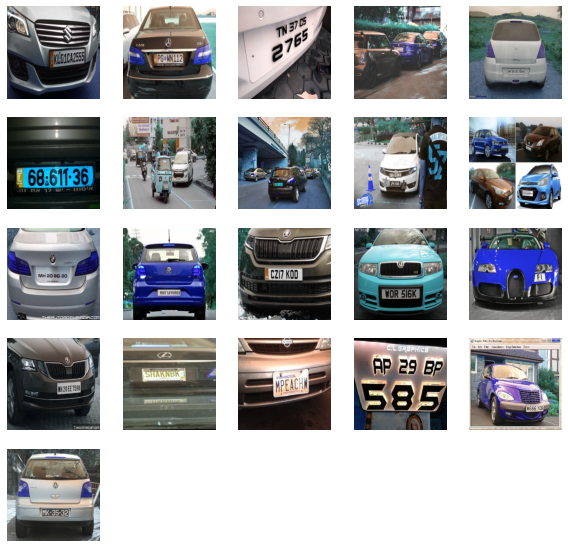

In [10]:
#displaying first 20 images in the dataset
plt.figure(figsize=(10,20))
for i in range(0,21) :
    plt.subplot(10,5,i+1)
    plt.axis('off')
    plt.imshow(X[i])

In [11]:
#Transforming to an array
X=np.array(X)
y=np.array(y)

In [12]:
#normalisation
X = X / 255.
y = y / 255.

In [13]:
#train test split

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

##### <font color=darkblue>Creating a base model using Convolutional Neural Network</font>

In [14]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D,MaxPooling2D,Flatten,Dense,Dropout

base_model=Sequential()

base_model.add(Conv2D(64,(3,3),activation='relu',input_shape=(IMAGE_SIZE,IMAGE_SIZE,3)))
base_model.add(Conv2D(64,(3,3),activation='relu'))
base_model.add(MaxPooling2D(pool_size=(2,2)))

base_model.add(Conv2D(32,(3,3),activation='relu',input_shape=(IMAGE_SIZE,IMAGE_SIZE,3)))
base_model.add(Conv2D(32,(3,3),activation='relu'))
base_model.add(MaxPooling2D(pool_size=(2,2)))

base_model.add(Conv2D(128,(3,3),activation='relu',input_shape=(IMAGE_SIZE,IMAGE_SIZE,3)))
base_model.add(Conv2D(128,(3,3),activation='relu'))
base_model.add(MaxPooling2D(pool_size=(2,2)))

base_model.add(Conv2D(32,(3,3),activation='relu',input_shape=(IMAGE_SIZE,IMAGE_SIZE,3)))
base_model.add(Conv2D(32,(3,3),activation='relu'))
base_model.add(MaxPooling2D(pool_size=(2,2)))

base_model.add(Flatten())
          
base_model.add(Dense(128, activation="relu"))
base_model.add(Dense(128, activation="relu"))
base_model.add(Dense(64, activation="relu"))
base_model.add(Dense(4, activation="softmax"))


In [15]:
base_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 222, 222, 64)      1792      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 220, 220, 64)      36928     
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 110, 110, 64)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 108, 108, 32)      18464     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 106, 106, 32)      9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 53, 53, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 51, 51, 128)       3

In [16]:
base_model.compile(loss='mean_squared_error',metrics=['accuracy'],optimizer='adam')

In [17]:
b1=base_model.fit(x=X_train,y=y_train,batch_size=32,epochs=100,validation_data=(X_test,y_test))

Train on 346 samples, validate on 87 samples
Epoch 1/100
346/346 [==============================] - 111s 319ms/sample - loss: 0.0848 - accuracy: 0.5347 - val_loss: 0.0888 - val_accuracy: 0.5057
Epoch 2/100
346/346 [==============================] - 98s 284ms/sample - loss: 0.0817 - accuracy: 0.5462 - val_loss: 0.0881 - val_accuracy: 0.5057
Epoch 3/100
346/346 [==============================] - 84s 242ms/sample - loss: 0.0811 - accuracy: 0.5462 - val_loss: 0.0876 - val_accuracy: 0.5057
Epoch 4/100
346/346 [==============================] - 93s 267ms/sample - loss: 0.0808 - accuracy: 0.5462 - val_loss: 0.0876 - val_accuracy: 0.5057
Epoch 5/100
346/346 [==============================] - 94s 271ms/sample - loss: 0.0806 - accuracy: 0.5462 - val_loss: 0.0877 - val_accuracy: 0.5057
Epoch 6/100
346/346 [==============================] - 98s 282ms/sample - loss: 0.0804 - accuracy: 0.5462 - val_loss: 0.0876 - val_accuracy: 0.5287
Epoch 7/100
346/346 [==============================] - 92s 266ms/s

Epoch 56/100
346/346 [==============================] - 72s 208ms/sample - loss: 0.0693 - accuracy: 0.9624 - val_loss: 0.0846 - val_accuracy: 0.7816
Epoch 57/100
346/346 [==============================] - 72s 209ms/sample - loss: 0.0692 - accuracy: 0.9624 - val_loss: 0.0846 - val_accuracy: 0.8161
Epoch 58/100
346/346 [==============================] - 71s 207ms/sample - loss: 0.0692 - accuracy: 0.9595 - val_loss: 0.0845 - val_accuracy: 0.8046
Epoch 59/100
346/346 [==============================] - 71s 204ms/sample - loss: 0.0692 - accuracy: 0.9798 - val_loss: 0.0845 - val_accuracy: 0.8046
Epoch 60/100
346/346 [==============================] - 71s 206ms/sample - loss: 0.0692 - accuracy: 0.9740 - val_loss: 0.0849 - val_accuracy: 0.8391
Epoch 61/100
346/346 [==============================] - 71s 207ms/sample - loss: 0.0692 - accuracy: 0.9595 - val_loss: 0.0845 - val_accuracy: 0.7586
Epoch 62/100
346/346 [==============================] - 72s 207ms/sample - loss: 0.0692 - accuracy: 0.9624

In [18]:
base_model.evaluate(X_test, y_test)

87/87 [==============================] - 2s 28ms/sample - loss: 0.0846 - accuracy: 0.8276


[0.0846313982345592, 0.82758623]

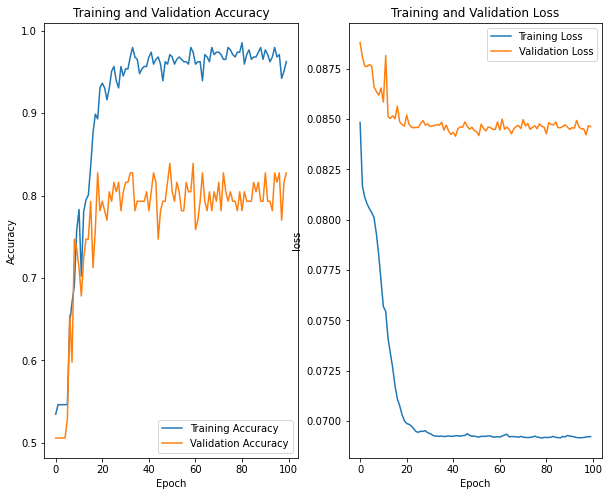

In [19]:
from matplotlib import pyplot as plt
acc = b1.history['accuracy']
val_acc = b1.history['val_accuracy']

loss = b1.history['loss']
val_loss = b1.history['val_loss']

epochs=100
epochs_range = range(epochs)

plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot( epochs_range,val_acc, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot( epochs_range,loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [20]:
#saving weights of the base model
base_model.save('base_model.h5')
base_model.save_weights('base_model_weights.h5')

##### <font color=darkblue>License plate detection</font> 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

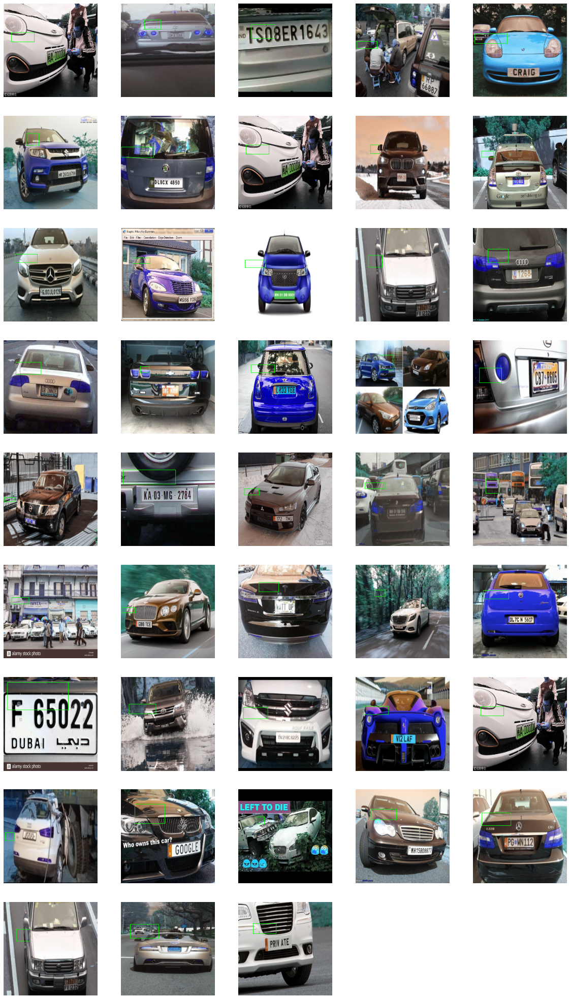

In [21]:
y_pred_base=base_model.predict(X_test)

plt.figure(figsize=(20,40))
for i in range(0,43) :
    plt.subplot(10,5,i+1)
    plt.axis('off')
    ny = y_pred_base[i]*255
    image = cv2.rectangle(X_test[i],(int(ny[0]),int(ny[1])),(int(ny[2]),int(ny[3])),(0, 255, 0))
    plt.imshow(image)

##### <font color=darkblue>Transfer Learning using a predefined model: ResNet50</font> 

In [22]:
#Transfer Learning from a predefined model
model = Sequential()

model.add(tf.keras.applications.ResNet50(weights="imagenet",input_shape=(IMAGE_SIZE,IMAGE_SIZE,3),include_top='True'))

model.add(Flatten())

model.add(Dense(128, activation="relu"))
model.add(Dense(128, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(4, activation="softmax"))

for layers in model.layers:
    if('dense' not in layers.name):  # don't train convlutional layers:freezing convolutional layers
        layers.trainable=False
    if('dense' in layers.name):      # train dense layers only
        layers.trainable=True
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Model)             (None, 1000)              25636712  
_________________________________________________________________
flatten_1 (Flatten)          (None, 1000)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 128)               128128    
_________________________________________________________________
dense_5 (Dense)              (None, 128)               16512     
_________________________________________________________________
dense_6 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_7 (Dense)              (None, 4)                 260       
Total params: 25,789,868
Trainable params: 153,156
Non-trainable params: 25,636,712
____________________________________

In [23]:
model.compile(loss='mean_squared_error',metrics=['accuracy'],optimizer='adam')

In [24]:
m1=model.fit(x=X_train,y=y_train,batch_size=32,epochs=100,validation_data=(X_test,y_test))

Train on 346 samples, validate on 87 samples
Epoch 1/100
346/346 [==============================] - 102s 295ms/sample - loss: 0.0883 - accuracy: 0.5173 - val_loss: 0.0900 - val_accuracy: 0.5057
Epoch 2/100
346/346 [==============================] - 90s 259ms/sample - loss: 0.0822 - accuracy: 0.5462 - val_loss: 0.0884 - val_accuracy: 0.5057
Epoch 3/100
346/346 [==============================] - 90s 260ms/sample - loss: 0.0811 - accuracy: 0.5462 - val_loss: 0.0880 - val_accuracy: 0.5057
Epoch 4/100
346/346 [==============================] - 90s 260ms/sample - loss: 0.0807 - accuracy: 0.5462 - val_loss: 0.0880 - val_accuracy: 0.5057
Epoch 5/100
346/346 [==============================] - 90s 259ms/sample - loss: 0.0802 - accuracy: 0.5462 - val_loss: 0.0878 - val_accuracy: 0.5057
Epoch 6/100
346/346 [==============================] - 89s 258ms/sample - loss: 0.0796 - accuracy: 0.5462 - val_loss: 0.0880 - val_accuracy: 0.5057
Epoch 7/100
346/346 [==============================] - 90s 259ms/s

Epoch 56/100
346/346 [==============================] - 99s 286ms/sample - loss: 0.0697 - accuracy: 0.9220 - val_loss: 0.0928 - val_accuracy: 0.4943
Epoch 57/100
346/346 [==============================] - 99s 286ms/sample - loss: 0.0699 - accuracy: 0.9104 - val_loss: 0.0927 - val_accuracy: 0.4943
Epoch 58/100
346/346 [==============================] - 101s 292ms/sample - loss: 0.0699 - accuracy: 0.9104 - val_loss: 0.0931 - val_accuracy: 0.4943
Epoch 59/100
346/346 [==============================] - 98s 284ms/sample - loss: 0.0698 - accuracy: 0.9133 - val_loss: 0.0935 - val_accuracy: 0.4943
Epoch 60/100
346/346 [==============================] - 99s 287ms/sample - loss: 0.0698 - accuracy: 0.9220 - val_loss: 0.0926 - val_accuracy: 0.4943
Epoch 61/100
346/346 [==============================] - 99s 286ms/sample - loss: 0.0697 - accuracy: 0.9509 - val_loss: 0.0932 - val_accuracy: 0.4943
Epoch 62/100
346/346 [==============================] - 100s 289ms/sample - loss: 0.0697 - accuracy: 0.91

In [25]:
model.evaluate(X_test, y_test)  #test loss and accuracy

87/87 [==============================] - 5s 59ms/sample - loss: 0.0929 - accuracy: 0.4943


[0.09287869296539789, 0.49425286]

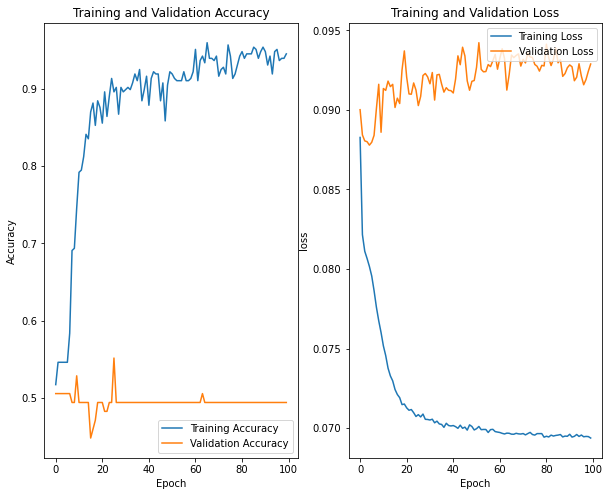

In [26]:
from matplotlib import pyplot as plt
acc = m1.history['accuracy']
val_acc = m1.history['val_accuracy']

loss = m1.history['loss']
val_loss = m1.history['val_loss']

epochs=100
epochs_range = range(epochs)

plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot( epochs_range,val_acc, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot( epochs_range,loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

##### <font color=darkblue>License plate detection</font> 

In [27]:
y_pred=model.predict(X_test)
y_pred.shape

(87, 4)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

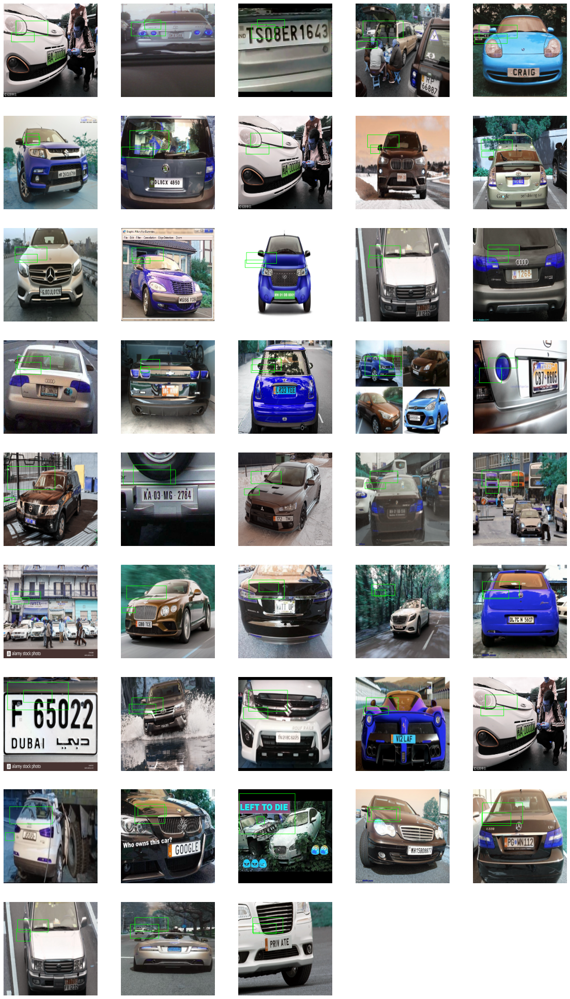

In [28]:
plt.figure(figsize=(20,40))
for i in range(0,43) :
    plt.subplot(10,5,i+1)
    plt.axis('off')
    ny = y_pred[i]*255
    image = cv2.rectangle(X_test[i],(int(ny[0]),int(ny[1])),(int(ny[2]),int(ny[3])),(0, 255, 0))
    plt.imshow(image)

#####  <font color=darkblue>Transfer learning using predefined  weights</font>

In [29]:
model1=Sequential()
model1.add(Conv2D(64,(3,3),activation='relu',input_shape=(IMAGE_SIZE,IMAGE_SIZE,3)))
model1.add(Conv2D(64,(3,3),activation='relu'))
model1.add(MaxPooling2D(pool_size=(2,2)))

model1.add(Conv2D(32,(3,3),activation='relu',input_shape=(IMAGE_SIZE,IMAGE_SIZE,3)))
model1.add(Conv2D(32,(3,3),activation='relu'))
model1.add(MaxPooling2D(pool_size=(2,2)))

model1.add(Conv2D(128,(3,3),activation='relu',input_shape=(IMAGE_SIZE,IMAGE_SIZE,3)))
model1.add(Conv2D(128,(3,3),activation='relu'))
model1.add(MaxPooling2D(pool_size=(2,2)))

model1.add(Conv2D(32,(3,3),activation='relu',input_shape=(IMAGE_SIZE,IMAGE_SIZE,3)))
model1.add(Conv2D(32,(3,3),activation='relu'))
model1.add(MaxPooling2D(pool_size=(2,2)))

model1.add(Flatten())
          
model1.add(Dense(128, activation="relu"))
model1.add(Dense(128, activation="relu"))
model1.add(Dense(64, activation="relu"))
model1.add(Dense(4, activation="softmax"))


In [30]:
for layers in model.layers:
    if('dense' not in layers.name):
        layers.trainable = False
    if('dense' in layers.name):
        print(layers.name + ' is trained')

dense_4 is trained
dense_5 is trained
dense_6 is trained
dense_7 is trained


In [31]:
project_path="C:\\Users\\admin\\Music\\M.Tech DSML\\SEMESTER 2\\Intro to Deep Learning and  application\\presentation\\"

In [32]:
model1.load_weights(project_path + 'base_model_weights.h5')

In [33]:
model1.compile(loss="mean_squared_error", metrics=["accuracy"], optimizer="adam")

In [34]:
import tensorflow

callback = tensorflow.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=2, min_delta=0.01)

# Fit the model
m2=model1.fit(x=X_train, y=y_train, batch_size=32, epochs=100, validation_data=(X_test, y_test), callbacks=[callback])

Train on 346 samples, validate on 87 samples
Epoch 1/100
346/346 [==============================] - 75s 218ms/sample - loss: 0.0695 - accuracy: 0.9422 - val_loss: 0.1546 - val_accuracy: 0.5977
Epoch 2/100
346/346 [==============================] - 70s 204ms/sample - loss: 0.0695 - accuracy: 0.9277 - val_loss: 0.1618 - val_accuracy: 0.5977
Epoch 3/100
346/346 [==============================] - 70s 203ms/sample - loss: 0.0695 - accuracy: 0.9711 - val_loss: 0.1556 - val_accuracy: 0.5977


In [35]:
model1.evaluate(X_test, y_test)

87/87 [==============================] - 3s 31ms/sample - loss: 0.1556 - accuracy: 0.5977


[0.15561271458864212, 0.59770113]

In [36]:
y_pred_model1=model1.predict(X_test)

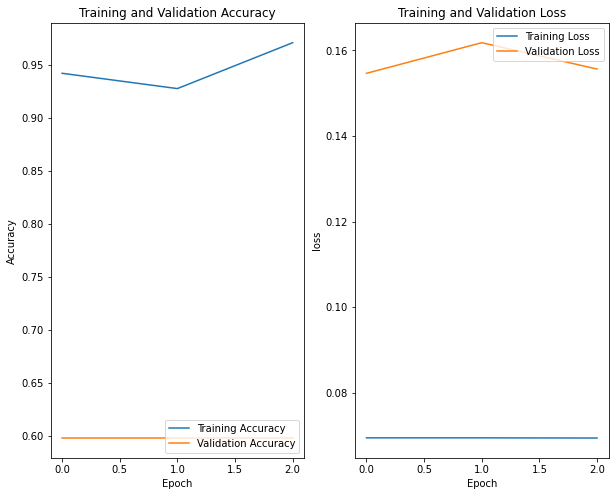

In [38]:
from matplotlib import pyplot as plt
acc = m2.history['accuracy']
val_acc = m2.history['val_accuracy']

loss = m2.history['loss']
val_loss = m2.history['val_loss']

epochs=3
epochs_range = range(epochs)

plt.figure(figsize=(10, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot( epochs_range,val_acc, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot( epochs_range,loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

##### <font color=darkblue>License plate detection</font> 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

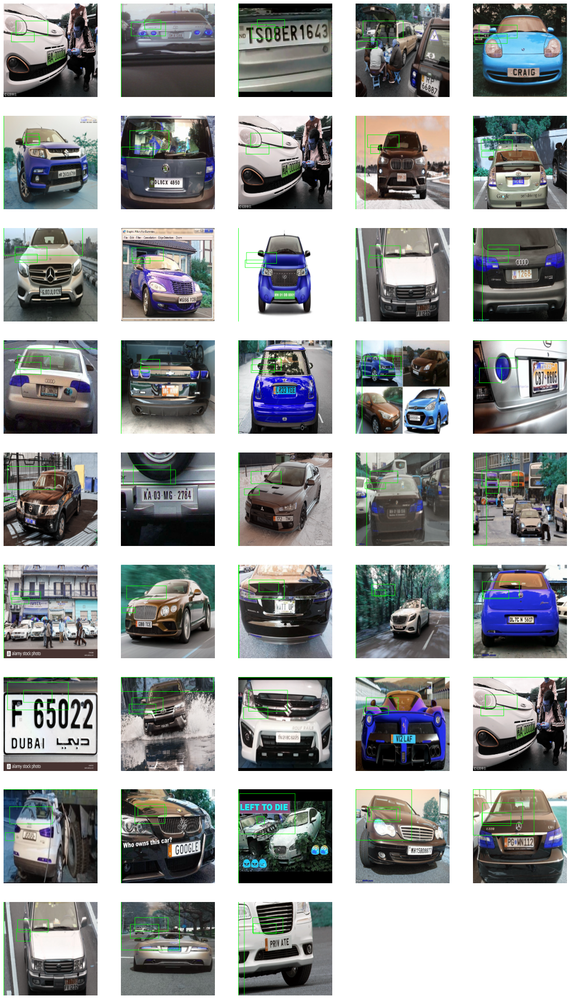

In [39]:
plt.figure(figsize=(20,40))
import matplotlib.patches as patches
for i in range(0,43) :
    plt.subplot(10,5,i+1)
    plt.axis('off')
    ny = y_pred_model1[i]*255
    image = cv2.rectangle(X_test[i],(int(ny[0]),int(ny[1])),(int(ny[2]),int(ny[3])),(0,255,0))
    plt.imshow(image)

##### <font color=darkblue>predicting images from the dataset</font> 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


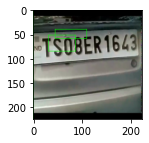

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Preiction for above image:  1


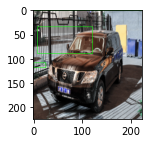

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


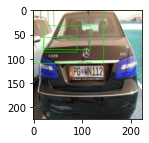

Preiction for above image:  0


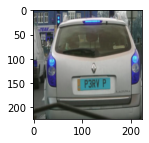

Preiction for above image:  1


In [41]:
plt.figure(figsize=(2,2)) 
plt.imshow(X_test[2])
plt.show()
print("Preiction for above image: ", np.argmax(model1.predict(X_test[2].reshape(1,224,224,3))))

plt.figure(figsize=(2,2)) 
plt.imshow(X_test[20])
plt.show()
("Preiction for above image: ", np.argmax(model1.predict(X_test[20].reshape(1,224,224,3))))

plt.figure(figsize=(2,2)) 
plt.imshow(X_test[39])
plt.show()
print("Preiction for above image: ", np.argmax(model1.predict(X_test[39].reshape(1,224,224,3))))

plt.figure(figsize=(2,2)) 
plt.imshow(X_test[60])
plt.show()
print("Preiction for above image: ", np.argmax(model1.predict(X_test[60].reshape(1,224,224,3))))

# <font color=darkblue>Thank you!</font>